In [112]:
# Import the libraries
from pystac.extensions.eo import EOExtension as eo
import pystac_client
import planetary_computer
from odc.stac import configure_rio, stac_load
import dask.distributed
import dask.utils
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from IPython.display import display

In [113]:
# Set up Dask client for parallel processing
client = dask.distributed.Client()
configure_rio(cloud_defaults=True, client=client)

# Configure rio with dynamic resolution
resolution = 20
memory_limit = dask.utils.parse_bytes(client.cluster.workers[0].memory_manager.memory_limit)
SHRINK = 4
if memory_limit < dask.utils.parse_bytes("4G"):
    SHRINK = 8  # Adjust chunk size if memory is limited

resolution = resolution * SHRINK

/opt/anaconda3/lib/python3.12/site-packages/distributed/node.py:187: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 61561 instead
  warnings.warn(


In [114]:
# # # Define the area of interest (AOI) near Jonah Bay, Alaska.
area_of_interest = {
        "type": "Polygon",
        "coordinates": [
            [
             [-148.56536865234375, 60.80072385643073],
             [-147.44338989257812, 60.80072385643073],
             [-147.44338989257812, 61.18363894915102],
             [-148.56536865234375, 61.18363894915102],
             [-148.56536865234375, 60.80072385643073]  # Closing point 
            ]
        ],
   }

#  time span of 1 month 
time_of_interest = "2023-08-01/2023-09-01" 

# Query the catalog for the data
catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace,
)
search = catalog.search(
    collections=["sentinel-2-l2a"],
    intersects=area_of_interest,
    datetime=time_of_interest,
    #query={"eo:cloud_cover": {"lt": 10}}
)
items = list(search.items())
print(f"Returned {len(items)} Items")

Returned 18 Items


In [115]:
xx = stac_load(
    items,
    chunks={"x": 1024 * SHRINK, "y": 1024 * SHRINK},  # Dynamically adjust chunk size
    patch_url=planetary_computer.sign,
    resolution=resolution,
    dtype="uint16",  # Handle missing data by marking nodata values
    nodata=0
)

# Display loaded data
print(f"Bands: {','.join(list(xx.data_vars))}")
display(xx)

Bands: AOT,B01,B02,B03,B04,B05,B06,B07,B08,B09,B11,B12,B8A,SCL,WVP,visual


<xarray.Dataset> Size: 272MB
Dimensions:      (y: 687, x: 687, time: 18)
Coordinates:
  * y            (y) float64 5kB 6.8e+06 6.8e+06 6.8e+06 ... 6.69e+06 6.69e+06
  * x            (x) float64 5kB 3.999e+05 4.001e+05 ... 5.095e+05 5.097e+05
    spatial_ref  int32 4B 32606
  * time         (time) datetime64[ns] 144B 2023-08-02T21:25:31.024000 ... 20...
Data variables: (12/16)
    AOT          (time, y, x) uint16 17MB dask.array<chunksize=(1, 687, 687), meta=np.ndarray>
    B01          (time, y, x) uint16 17MB dask.array<chunksize=(1, 687, 687), meta=np.ndarray>
    B02          (time, y, x) uint16 17MB dask.array<chunksize=(1, 687, 687), meta=np.ndarray>
    B03          (time, y, x) uint16 17MB dask.array<chunksize=(1, 687, 687), meta=np.ndarray>
    B04          (time, y, x) uint16 17MB dask.array<chunksize=(1, 687, 687), meta=np.ndarray>
    B05          (time, y, x) uint16 17MB dask.array<chunksize=(1, 687, 687), meta=np.ndarray>
    ...           ...
    B11          (time, y, x) uint16 17MB dask.array<chunksize=(1, 687, 687), meta=np.ndarray>
    B12          (time, y, x) uint16 17MB dask.array<chunksize=(1, 687, 687), meta=np.ndarray>
    B8A          (time, y, x) uint16 17MB dask.array<chunksize=(1, 687, 687), meta=np.ndarray>
    SCL          (time, y, x) uint16 17MB dask.array<chunksize=(1, 687, 687), meta=np.ndarray>
    WVP          (time, y, x) uint16 17MB dask.array<chunksize=(1, 687, 687), meta=np.ndarray>
    visual       (time, y, x) uint16 17MB dask.array<chunksize=(1, 687, 687), meta=np.ndarray>

In [116]:
# Function to convert data to float and handle missing nodata values
def to_float(xx, nodata_value=None):
    _xx = xx.astype("float32")  # Convert data to float32 for precision
    if nodata_value is None:
        nodata_value = _xx.attrs.pop("nodata", None)  # Fetch nodata value if exists
    if nodata_value is not None:
        return _xx.where(xx != nodata_value)  # Replace nodata with NaN
    return _xx

# Convert specific bands to float32 and handle missing data
b05 = to_float(xx.B05)  # Red-Edge band
b04 = to_float(xx.B04)  # Red band

In [117]:
# Calculate NDCI with small constant to avoid division by zero
ndci = (b05 - b04) / (b05 + b04 + 1e-6)

# Apply Min-Max normalization to scale NDCI between 0 and 1
ndci = (ndci - ndci.min()) / (ndci.max() - ndci.min())

chl = 826.57*(ndci**3) - 176.43*(ndci**2) + 19*(ndci) + 4.071

In [118]:
time_dim = chl['time']

#split 70% for training and  30% for testing
split_index = int(0.7 * len(time_dim))

#split the dataset based on the time dimension
train = chl.isel(time=slice(0, split_index))  # first 70% of the time steps
test = chl.isel(time=slice(split_index, len(time_dim)))  #

In [119]:
test_clean = test.fillna(0)  #replace NaN values with 0 

#convert the DataArray to a NumPy array
test_data_np = test_clean.values

time, y, x = test_data_np.shape

#reshape Dataarray to 2d and flatten size into a single column
test_data = test_data_np.reshape(time, y*x) #(row, col)

In [88]:
df = test.to_dataframe(name="chl").reset_index()

# Display the resulting DataFrame
print(df)

                           time          y         x  spatial_ref        chl
0       2023-08-24 21:15:19.024  6800080.0  399920.0        32606        NaN
1       2023-08-24 21:15:19.024  6800080.0  400080.0        32606        NaN
2       2023-08-24 21:15:19.024  6800080.0  400240.0        32606        NaN
3       2023-08-24 21:15:19.024  6800080.0  400400.0        32606        NaN
4       2023-08-24 21:15:19.024  6800080.0  400560.0        32606        NaN
...                         ...        ...       ...          ...        ...
2831809 2023-09-01 21:25:31.024  6690320.0  509040.0        32606  68.417908
2831810 2023-09-01 21:25:31.024  6690320.0  509200.0        32606  68.316772
2831811 2023-09-01 21:25:31.024  6690320.0  509360.0        32606  68.457382
2831812 2023-09-01 21:25:31.024  6690320.0  509520.0        32606  68.430206
2831813 2023-09-01 21:25:31.024  6690320.0  509680.0        32606  68.800079

[2831814 rows x 5 columns]


In [23]:
train_data_clean = train.fillna(0)  #replace NaN values with 0 


#convert the DataArray to a NumPy array
train_data_np = train_data_clean.values

time, y, x = train_data_np.shape

#reshape Dataarray to 2d and flatten coordinates
train_data = train_data_np.reshape(time, y*x) #(row, col)
display(train_data)

array([[ 0.      ,  0.      ,  0.      , ..., 76.843414, 76.22032 ,
        76.24574 ],
       [ 0.      ,  0.      ,  0.      , ..., 78.92378 , 79.47684 ,
        78.75524 ],
       [ 0.      ,  0.      ,  0.      , ...,  0.      ,  0.      ,
         0.      ],
       ...,
       [ 0.      ,  0.      ,  0.      , ..., 77.57562 , 77.9465  ,
        80.98077 ],
       [ 0.      ,  0.      ,  0.      , ...,  0.      ,  0.      ,
         0.      ],
       [ 0.      ,  0.      ,  0.      , ..., 70.63178 , 70.13446 ,
        71.345985]], dtype=float32)

In [26]:
from sklearn_xarray import wrap
from pmdarima.arima import ARIMA

# Initialize the ARIMA model
arima_model = ARIMA(order=(1, 0, 1))

# Wrap the ARIMA model with sklearn-xarray
model = wrap(arima_model)

# Initialize an empty list to store the forecasted values for each spatial location
forecasts = []

for spatial_column in range(train_data.shape[1]):  # (time_steps, spatial_locations)
    spatial_series = train_data[:, spatial_column]  # Extract the time series for this spatial location
    
    # Reshape the series to (time_steps, 1) to make it a 2D array
    spatial_series_reshaped = spatial_series.reshape(-1, 1)

    # Fit the model to the time series for this spatial location
    model_fit = model.fit(spatial_series_reshaped)
    
    # Forecast for this spatial location
    forecast = model_fit.predict(len(test_data)) 
    
    forecasts.append(forecast)

# Combine all forecasts into a single array
forecast_array = np.array(forecasts).T  # Tr

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: M

In [120]:
import numpy as np

# Save forecast_array as a .npy file
# np.save('forecast_array.npy', forecast_array)

# To load it later
loaded_forecast = np.load('forecast_array.npy')


In [110]:
loaded_forecast.shape

(6, 471969)

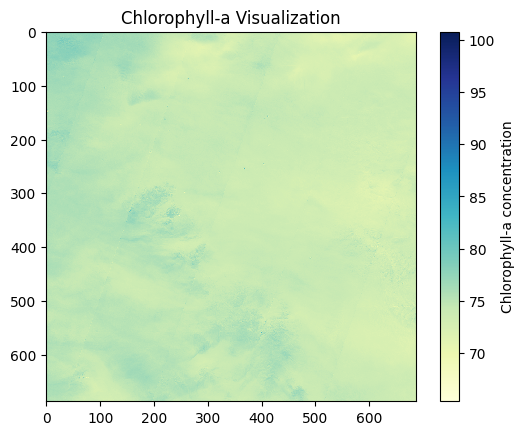

In [132]:
#visualizing test data 

band_to_visualize1 = test[0, :, :]  

plt.imshow(band_to_visualize1, cmap='YlGnBu', interpolation='nearest')  # A blue-green color map
plt.colorbar(label='Chlorophyll-a concentration')
plt.title('Chlorophyll-a Visualization')
plt.show()

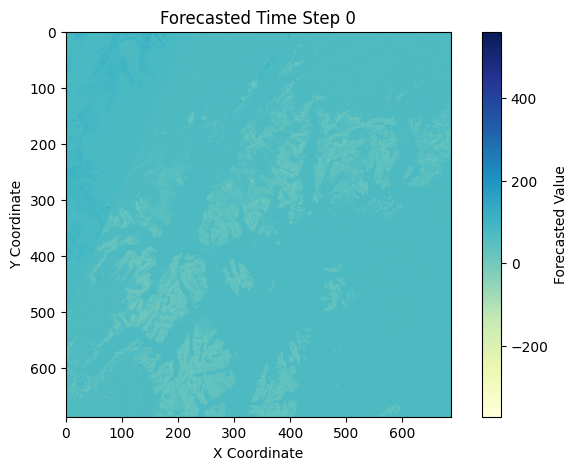

In [133]:
import numpy as np
import matplotlib.pyplot as plt

y, x = 687, 687  
time_step = 0  

# reshape the spatial data for the selected time step
heatmap_data = forecast_array[time_step].reshape(y, x)

# visualizing forecast image
plt.figure(figsize=(8, 5))
plt.imshow(heatmap_data, cmap='YlGnBu', origin='upper')  # Use a color map like 'viridis'
plt.colorbar(label='Forecasted Value')
plt.title(f'Forecasted Time Step {time_step}')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.show()
